# Изучение современных нейросетевых моделей для решения задачи сегментации изображений

## В данной работе мы реализуем пакет нейросетевых методов сегментации, изучив архитектуры исследуемых моделей, проверим работу изученных моделей на практике и проведём исследования по сравнению качества и точности распознавания различных классов с помощью метрик точности на тестовых изображениях. 

### Установка необходимых библиотек

In [152]:
import time
import numpy as np
import matplotlib.pyplot as plt
import requests
from io import BytesIO
from PIL import Image
import torch
import torch.nn.functional as F
from torch import nn
from sklearn.cluster import MeanShift as SkMeanShift
from torch.distributions import MultivariateNormal
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
from ultralytics import SAM
import torchvision
from torchvision import transforms
import torchvision.transforms as T
from transformers import OneFormerProcessor, OneFormerForUniversalSegmentation
from transformers import Mask2FormerImageProcessor, Mask2FormerForUniversalSegmentation
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
from transformers import AutoImageProcessor, AutoModelForSemanticSegmentation
import segmentation_models_pytorch as smp
from scipy.ndimage import zoom
from huggingface_hub import hf_hub_download, list_repo_files

Here we load the model as well as the image processor from the HuggingFace Hub. Note that NVIDIA has released several checkpoints, all of which can be found here. Be sure to play around with them!

The image processor can be used to prepare images for the model, and postprocess the results.

We move the model to GPU if it's available.

In [153]:
if torch.cuda.is_available():
    print("cuda")
else:
    print("cpu")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

cuda


In [154]:
print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

GPU Memory: 21.00 GB


In [ ]:
# 1. Инициализация
model_name = "nvidia/segformer-b5-finetuned-ade-640-640" # Официальный ID модели[citation:1][citation:5]
local_model_path = "/home/yamshchikov/ML_practice/models/segformer-b5" # путь

# 2. Сначала попробуем загрузить локально (быстрый путь)
try:
    processor = SegformerImageProcessor.from_pretrained(local_model_path)
    model = SegformerForSemanticSegmentation.from_pretrained(local_model_path)
    print("✓ Модель успешно загружена из локального кэша.")
except OSError:
    print("Модель не найдена локально. Продолжаем...")

### For visualizing classes we will use palette for ADE20K dataset

Finally, let's visualize the segmentation map as predicted by the model. Semantic segmentation datasets typically define what is called a "color palette", that defines the RGB color values to use for each of the classes.

The ADE20k dataset consists of 150 classes, so the list below has 150 elements.

In [155]:
def ade_palette():
    """ADE20K palette that maps each class to RGB values."""
    return [[120, 120, 120], [180, 120, 120], [6, 230, 230], [80, 50, 50],
            [4, 200, 3], [120, 120, 80], [140, 140, 140], [204, 5, 255],
            [230, 230, 230], [4, 250, 7], [224, 5, 255], [235, 255, 7],
            [150, 5, 61], [120, 120, 70], [8, 255, 51], [255, 6, 82],
            [143, 255, 140], [204, 255, 4], [255, 51, 7], [204, 70, 3],
            [0, 102, 200], [61, 230, 250], [255, 6, 51], [11, 102, 255],
            [255, 7, 71], [255, 9, 224], [9, 7, 230], [220, 220, 220],
            [255, 9, 92], [112, 9, 255], [8, 255, 214], [7, 255, 224],
            [255, 184, 6], [10, 255, 71], [255, 41, 10], [7, 255, 255],
            [224, 255, 8], [102, 8, 255], [255, 61, 6], [255, 194, 7],
            [255, 122, 8], [0, 255, 20], [255, 8, 41], [255, 5, 153],
            [6, 51, 255], [235, 12, 255], [160, 150, 20], [0, 163, 255],
            [140, 140, 140], [250, 10, 15], [20, 255, 0], [31, 255, 0],
            [255, 31, 0], [255, 224, 0], [153, 255, 0], [0, 0, 255],
            [255, 71, 0], [0, 235, 255], [0, 173, 255], [31, 0, 255],
            [11, 200, 200], [255, 82, 0], [0, 255, 245], [0, 61, 255],
            [0, 255, 112], [0, 255, 133], [255, 0, 0], [255, 163, 0],
            [255, 102, 0], [194, 255, 0], [0, 143, 255], [51, 255, 0],
            [0, 82, 255], [0, 255, 41], [0, 255, 173], [10, 0, 255],
            [173, 255, 0], [0, 255, 153], [255, 92, 0], [255, 0, 255],
            [255, 0, 245], [255, 0, 102], [255, 173, 0], [255, 0, 20],
            [255, 184, 184], [0, 31, 255], [0, 255, 61], [0, 71, 255],
            [255, 0, 204], [0, 255, 194], [0, 255, 82], [0, 10, 255],
            [0, 112, 255], [51, 0, 255], [0, 194, 255], [0, 122, 255],
            [0, 255, 163], [255, 153, 0], [0, 255, 10], [255, 112, 0],
            [143, 255, 0], [82, 0, 255], [163, 255, 0], [255, 235, 0],
            [8, 184, 170], [133, 0, 255], [0, 255, 92], [184, 0, 255],
            [255, 0, 31], [0, 184, 255], [0, 214, 255], [255, 0, 112],
            [92, 255, 0], [0, 224, 255], [112, 224, 255], [70, 184, 160],
            [163, 0, 255], [153, 0, 255], [71, 255, 0], [255, 0, 163],
            [255, 204, 0], [255, 0, 143], [0, 255, 235], [133, 255, 0],
            [255, 0, 235], [245, 0, 255], [255, 0, 122], [255, 245, 0],
            [10, 190, 212], [214, 255, 0], [0, 204, 255], [20, 0, 255],
            [255, 255, 0], [0, 153, 255], [0, 41, 255], [0, 255, 204],
            [41, 0, 255], [41, 255, 0], [173, 0, 255], [0, 245, 255],
            [71, 0, 255], [122, 0, 255], [0, 255, 184], [0, 92, 255],
            [184, 255, 0], [0, 133, 255], [255, 214, 0], [25, 194, 194],
            [102, 255, 0], [92, 0, 255]]

### Модель 1: SegFormer

SegFormer represents a pivotal shift in how semantic segmentation is approached, blending the global context modeling of Transformers with the efficiency of lightweight MLPs. Unlike earlier models that relied on heavy convolutional architectures or complex decoders, SegFormer introduces a clean, simple design that excels across diverse environments.

Developed by researchers at NVIDIA, SegFormer bridges the gap between accuracy, speed, and generalization with a revolutionary encoder-decoder design, delivering up to 84.0% mIoU on Cityscapes and setting a new benchmark of 51.8% mIoU on ADE20K.

All while being up to 5× faster and 4× smaller than earlier Transformer counterparts like SETR.

### **Example of SegFormer Semantics Segmentation**

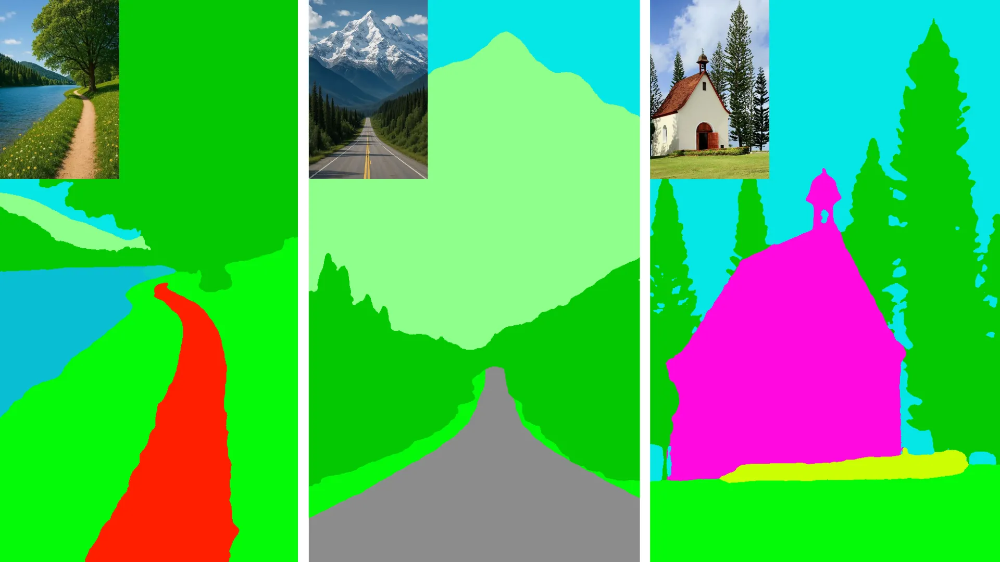

For example, imagine you're looking at a street scene: a segmentation model can tell which pixels belong to the car, which belong to the road, the sky, pedestrians, and so on the pixel level.

### **SegFormer Structure**

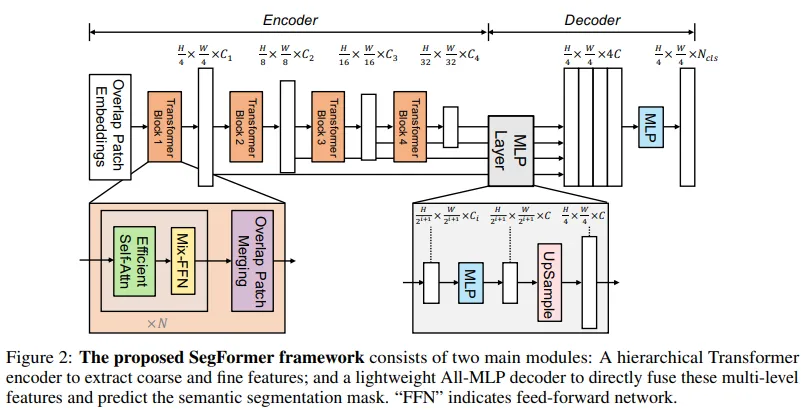

SegFormer is a modern semantic segmentation model that makes two key innovations to deliver high accuracy, speed, and robustness, all in an easy-to-use package:

1. Hierarchical, Positional-Encoding-Free Transformer Encoder
* Instead of using fixed positional embeddings (which must be interpolated at test time and can hurt performance when image sizes change), SegFormer’s encoder learns positional information implicitly via its feed-forward blocks.
* It processes an input image at four different scales so you get both fine (high-resolution) and coarse (low-resolution) feature maps, much like a CNN backbone but without handcrafted modules.
2. Lightweight All-MLP Decoder
* All it uses are simple multi-layer perceptron (MLP) layers: no complex convolutional or attention modules.
* It takes the multi-scale features from the encoder, projects them to a common channel size, upsamples to 1/4 resolution, concatenates them, and applies just two more MLPs: one for feature fusion and one to predict the final per-pixel class scores. This yields powerful representations by combining both local cues (lower layers) and global context (higher layers)

### **How does this help the model?**

* **Accuracy**: Matches or exceeds top models like SETR and DeepLabV3+, achieving up to 84.0% mIoU on Cityscapes.
* **Efficiency**: The smallest variant (SegFormer-B0) runs at ~48 FPS on high-res images with just 3.8 M parameters: ideal for real-time or edge applications.
* **Robustness**: Excels under blur, noise, weather, and lighting corruptions, making it suitable for safety-critical use cases.

### Инициализация основных функций

In [156]:
def create_overlay(image: Image.Image, mask: np.ndarray, alpha: float = 0.5, palette=None):
    """
    Создаёт визуализацию: оригинал + цветная маска.
    
    Args:
        image: PIL.Image в RGB
        mask: np.ndarray [H, W] с целочисленными метками классов
        alpha: коэффициент блендинга (0 = только фото, 1 = только маска)
        palette: список цветов [R,G,B] для каждого класса (по умолчанию ADE20K)
    
    Returns:
        PIL.Image с наложенной маской
    """
    if palette is None:
        palette = ade_palette()
    palette = np.array(palette, dtype=np.uint8)
    
    # Создаём цветную маску
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    
    # Присваиваем цвет каждому классу (без цикла для скорости)
    for label, color in enumerate(palette[:mask.max()+1]):
        color_mask[mask == label] = color
    
    # Блендинг
    img_arr = np.array(image.convert("RGB"))
    overlay = (img_arr * (1 - alpha) + color_mask * alpha).astype(np.uint8)
    
    return Image.fromarray(overlay)

## Перечислим функции для реализации будущего инференса разных моделей

In [157]:
def extract_logits_info(outputs, model_type: str):
    """
    Извлекает информацию о логитах из outputs модели.
    
    Returns:
        dict с информацией: shape, min, max, mean, std
    """
    try:
        if model_type in ["hf", "segformer", "mask2former", "oneformer"]:
            # HuggingFace модели: outputs.logits или outputs[0]
            if hasattr(outputs, 'logits'):
                logits = outputs.logits
            elif isinstance(outputs, tuple) and len(outputs) > 0:
                logits = outputs[0] if isinstance(outputs[0], torch.Tensor) else None
            else:
                logits = None
                
        elif model_type == "deeplab_tv":
            # Torchvision: output['out']
            logits = outputs['out'][0] if isinstance(outputs, dict) else outputs
            
        elif model_type == "unet_smp":
            # SMP: raw output tensor [B, C, H, W]
            logits = outputs[0] if outputs.dim() == 4 else outputs
            
        elif model_type == "sam":
            # SAM: нет логитов в традиционном смысле
            return {"type": "SAM (no logits)", "note": "instance masks only"}
            
        else:
            return {"type": "unknown", "note": f"model_type={model_type}"}
        
        if logits is None:
            return {"type": "None", "note": "logits not found"}
        
        # Статистика логитов
        return {
            "type": type(logits).__name__,
            "shape": tuple(logits.shape),
            "min": float(logits.min().cpu()),
            "max": float(logits.max().cpu()),
            "mean": float(logits.mean().cpu()),
            "std": float(logits.std().cpu()),
            "device": str(logits.device)
        }
        
    except Exception as e:
        return {"error": str(e), "type": "extraction_failed"}

### Модель 1: SegFormer 

In [158]:
def infer_segformer(model, processor, image, alpha: float, device="cuda"):
    """
    Инференс для SegFormer — возвращает маску в размере оригинального изображения.
    """
    inputs = processor(images=image, return_tensors="pt").to(device)
    # print(inputs.shape)
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
    print(type(outputs[0]))
    logits_info = extract_logits_info(outputs, "segformer")
    print(f"📈 SegFormer logits: {logits_info}")
    # Post-process to get mask
    seg_map = processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]] # [H, W] = [height, width]
    )[0].cpu().numpy()
    print(seg_map)
    return seg_map, image

### Модель 2: Mask2Former 

Поддерживает семантическую, инстанс- и паноптическую сегментацию в одной модели

In [159]:
def infer_mask2former(model, processor, image, device="cuda"):
    #image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)
    # print(inputs.shape)
    with torch.no_grad():
        outputs = model(**inputs)
    print(type(outputs[0]))
    logits_info = extract_logits_info(outputs, "mask2former")
    print(f"📈 Mask2Former logits: {logits_info}")
    
    # Пост-процессинг
    result = processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0]
    predicted_mask = result.cpu().numpy()
    print(predicted_mask)
    return predicted_mask, image

Преимущества:
Единая архитектура для всех типов сегментации 
huggingface.co
State-of-the-art результаты на ADE20K, Cityscapes
Поддержка masked attention для лучшего моделирования контекста

### Модель 3: OneFormer (multi-task универсальный фреймворк)

Обучается один раз — выполняет все задачи сегментации

In [160]:
def infer_oneformer(model, processor, image, device="cuda"):
    
    #image = Image.open(image_path).convert("RGB")
    inputs = processor(images=image, task_inputs=["semantic"], return_tensors="pt").to(device)
    # print(inputs.shape)
    with torch.no_grad():
        outputs = model(**inputs)
    print(type(outputs[0]))
    logits_info = extract_logits_info(outputs, "oneformer")
    print(f"📈 OneFormer logits: {logits_info}")
    
    # Пост-процессинг
    predicted_mask = processor.post_process_semantic_segmentation(
        outputs, target_sizes=[image.size[::-1]]
    )[0].cpu().numpy()
    print(predicted_mask)
    return predicted_mask, image

Ключевая особенность: одна модель переключается между задачами через текстовый промпт task_inputs=["semantic"|"instance"|"panoptic"]

### Модель 4: DeepLabV3+ (классика с атрюс-свёртками)

Лучший выбор для multi-scale контекста и точных границ

💡 Важно: если модель обучена на COCO (20 классов), а вы работаете с ADE20K (150 классов), используйте совместимый чекпоинт или дообучайте модель.
Почему стоит рассмотреть:
mIoU 89.3% на Cityscapes 
averroes.ai
ASPP-модуль для захвата контекста разных масштабов
Хорошо документирован, много предобученных весов

In [161]:
def infer_deeplab_torchvision(model, image, device="cuda"):
    # Preprocessing
    preprocess = T.Compose([
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    
    # Инференс (единый формат)
    input_tensor = preprocess(image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        raw_output = model(input_tensor)  # dict with 'out'
    
    logits_info = extract_logits_info(raw_output, "deeplab_tv")
    print(f"📈 DeepLabV3+ logits: {logits_info}")
    
    # Пост-процессинг: argmax по классам + ресайз
    output = raw_output['out'][0]  # [C, H, W]
    predicted_mask = output.argmax(0).cpu().numpy()  # [H, W]
    
    # Ресайз к оригиналу при необходимости
    if predicted_mask.shape != image.size[::-1]:
        sh, sw = image.size[1]/predicted_mask.shape[0], image.size[0]/predicted_mask.shape[1]
        predicted_mask = zoom(predicted_mask, (sh, sw), order=0)
    print(predicted_mask)
    return predicted_mask, image

### Модель 5: U-Net (медицинская сегментация и малые датасеты)

In [162]:
def infer_unet_smp(model, image, encoder_name="resnet34", device="cuda"):
    
    preprocess_fn = smp.encoders.get_preprocessing_fn(encoder_name, "imagenet")
    
    image_np = np.array(image)
    
    # Preprocessing
    input_tensor = preprocess_fn(image_np)
    input_tensor = torch.from_numpy(input_tensor).permute(2, 0, 1).float().unsqueeze(0).to(device)
    # print(input_tensor.shape)
    
    with torch.no_grad():
        outputs = model(input_tensor)  # [B, C, H, W]
    print(type(outputs[0]))
    logits_info = extract_logits_info(outputs, "unet_smp")
    print(f"📈 U-Net logits: {logits_info}")
    
    # Пост-процессинг: argmax + ресайз к оригиналу
    predicted_mask = outputs.argmax(1).squeeze(0).cpu().numpy()  # [H, W]
    
    # Если модель работала на ресайзнутом изображении — интерполируем к оригиналу:
    if predicted_mask.shape != image.size[::-1]:
        sh, sw = image.size[1]/predicted_mask.shape[0], image.size[0]/predicted_mask.shape[1]
        predicted_mask = zoom(predicted_mask, (sh, sw), order=0)
    print(predicted_mask)
    return predicted_mask, image

Идеально для:
Медицинских изображений (МРТ, КТ, гистология)
Датасетов < 1000 изображений
Задач с чёткими границами объектов
💡 Совет: для U-Net всегда явно контролируйте размер входа/выхода — архитектура чувствительна к кратности 32/64 из-за даунсемплинга.

### Модель 6: MobileSAM / FastSAM (лёгкие модели для edge-устройств)

В 60 раз легче оригинального SAM, ~10 мс инференс
⚠️ Эти модели изначально для инстанс-сегментации, но их можно адаптировать под семантическую задачу путём объединения масок по классам.

In [163]:
def infer_sam(model, image, device="cuda"):
    img_w, img_h = image.size
    
    # Инференс (без prompts=None!)
    results = model(image)
    # print(results.shape)
    
    print(f"📈 MobileSAM: instance segmentation (no class logits)")
    if results[0].masks is not None:
        print(f"   Masks: {results[0].masks.data.shape}, conf: {results[0].boxes.conf if hasattr(results[0], 'boxes') else 'N/A'}")
    # Создаём семантическую карту из инстанс-масок
    seg_map = np.zeros((img_h, img_w), dtype=np.uint8)
    
    if results[0].masks is not None:
        masks = results[0].masks.data.cpu().numpy()
        for i, mask in enumerate(masks, start=1):
            # mask имеет форму (H_mask, W_mask) — обычно меньше оригинала
            mask_bin = (mask > 0.5).astype(np.uint8)
            mask_pil = Image.fromarray(mask_bin)
            # Ресайз: image.size = (width, height) — именно так ждёт resize()
            mask_resized = np.array(mask_pil.resize((img_w, img_h), Image.NEAREST))
            # Заполняем только пустые пиксели (избегаем перекрытия)
            empty = (seg_map == 0)
            # Теперь размеры совпадают: seg_map[H,W] и mask_resized[H,W]
            seg_map[empty & (mask_resized > 0)] = i
    print(seg_map) # [H, W], dtype=uint8
    return seg_map, image

In [164]:
def segment_image_unified(model, processor, image_input, model_type: str, 
                          alpha: float = 0.5, palette=None, device="cuda"):
    """
    Универсальная функция сегментации для любой архитектуры.
    
    Args:
        model: загруженная модель
        processor: процессор (для HF-моделей) или None
        image_input: путь к файлу, URL или PIL.Image
        model_type: "mask2former" | "oneformer" | "deeplab_tv" | "unet_smp" | "sam"
        alpha: прозрачность маски (0..1)
        palette: палитра цветов (по умолчанию ADE20K)
    
    Returns:
        PIL.Image с наложенной маской
    """
    
    # Загрузка изображения
    if isinstance(image_input, str):
        if image_input.startswith(('http://', 'https://')):
            resp = requests.get(image_input)
            image = Image.open(BytesIO(resp.content)).convert("RGB")
        else:
            image = Image.open(image_input).convert("RGB")
    elif isinstance(image_input, Image.Image):
        image = image_input.convert("RGB")
    else:
        raise ValueError("Unsupported input type")
    
    # Инференс в зависимости от типа модели
    if model_type == "mask2former":
        mask, _ = infer_mask2former(model, processor, image, device)
    elif model_type == "segformer":
        mask, _ = infer_segformer(model, processor, image, alpha, device)
    elif model_type == "oneformer":
        mask, _ = infer_oneformer(model, processor, image, device)
    elif model_type == "deeplab_tv":
        mask, _ = infer_deeplab_torchvision(model, image, device)
    elif model_type == "unet_smp":
        mask, _ = infer_unet_smp(model, image, device=device)
    elif model_type == "sam":
        mask, _ = infer_sam(model, image, device)
    else:
        raise ValueError(f"Unknown model_type: {model_type}")
    
    # Визуализация
    return create_overlay(image, mask, alpha=alpha, palette=palette)

In [182]:
import numpy as np
import torch
from sklearn.metrics import confusion_matrix, f1_score, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

def compute_metrics(pred_mask: np.ndarray, gt_mask: np.ndarray, num_classes: int, ignore_index: int = 255):
    """
    Вычисляет основные метрики семантической сегментации.
    
    Args:
        pred_mask: [H, W] предсказанные метки классов
        gt_mask: [H, W] ground truth метки
        num_classes: общее число классов
        ignore_index: индекс для игнорируемых пикселей (фон/неизвестно)
    
    Returns:
        dict с метриками
    """
    # Маска валидных пикселей
    valid = (gt_mask != ignore_index)
    
    if not np.any(valid):
        return {
            "mIoU": np.nan, 
            "pixel_acc": np.nan, 
            "f1_weighted": np.nan,
            "per_class_iou": [np.nan] * num_classes,
            "confusion_matrix": None,
            "unique_pred_classes": len(np.unique(pred_mask)),
            "valid_pixels": 0
        }
    
    pred_valid = pred_mask[valid]
    gt_valid = gt_mask[valid]

    # 🔧 Проверка: значения в ground truth должны быть в диапазоне [0, num_classes-1]
    gt_min, gt_max = gt_valid.min(), gt_valid.max()
    if gt_min < 0 or gt_max >= num_classes:
        print(f"⚠️ Warning: gt_mask values out of range [{gt_min}, {gt_max}], expected [0, {num_classes-1}]")
        # Клиппим значения
        gt_valid = np.clip(gt_valid, 0, num_classes - 1)
    
    # Pixel Accuracy
    pixel_acc = accuracy_score(gt_valid, pred_valid)
    
    # Confusion matrix
    cm = confusion_matrix(gt_valid, pred_valid, labels=range(num_classes))
    
    # Per-class IoU
    iou_per_class = []
    for c in range(num_classes):
        tp = cm[c, c]
        fp = cm[:, c].sum() - tp
        fn = cm[c, :].sum() - tp
        if tp + fp + fn == 0:
            iou_per_class.append(np.nan)
        else:
            iou_per_class.append(tp / (tp + fp + fn))
    
    # Mean IoU (игнорируем NaN для классов без пикселей)
    mIoU = np.nanmean(iou_per_class)
    
    # Weighted F1-score
    f1 = f1_score(gt_valid, pred_valid, average='weighted', labels=range(num_classes), zero_division=0)
    
    return {
        "mIoU": mIoU,
        "pixel_acc": pixel_acc,
        "f1_weighted": f1,
        "per_class_iou": np.array(iou_per_class),
        "confusion_matrix": cm,
        "unique_pred_classes": len(np.unique(pred_mask)),
        "valid_pixels": np.sum(valid)
    }

In [ ]:
# Инициализация
model_mobile_sam = SAM("mobile_sam.pt")  # ultralytics сам определяет cuda/cpu # или "fast_sam.pt"

Когда использовать:
Реальное время на мобильных устройствах
Прототипирование и демонстрации
Задачи, где скорость важнее предельной точности
🔁 Для истинной семантической сегментации (классы "дорога", "дерево" и т.д.) MobileSAM требует дообучения классификатора поверх масок или использования в связке с CLIP для zero-shot классификации регионов.

## **Inference result**

In [ ]:
model_name = "shi-labs/oneformer_ade20k_swin_large"
files = list_repo_files(model_name)

print("✅ safetensors found!" if any(f.endswith(".safetensors") for f in files) else "❌ Только pickle (.bin)")
print([f for f in files if f.endswith((".safetensors", ".bin"))])

❌ Только pickle (.bin)
['pytorch_model.bin']


📊 Сравнительная таблица архитектур
Модель
mIoU (ADE20K)
Params
Inference (A100)
Лучше всего для
SegFormer-B5
~51.0%
137M
~45 ms
Баланс точности/скорости 
huggingface.co
Mask2Former
~56.4%
60M
~80 ms
Универсальные задачи 
debuggercafe.com
OneFormer
~57.1%
190M
~120 ms
Multi-task обучение 
GitHub
DeepLabV3+
~45.7%
59M
~35 ms
Классические CV-задачи 
averroes.ai
U-Net (ResNet34)
~42.1%
31M
~25 ms
Медицина, малые данные 
medium.com
MobileSAM
~48.2%*
10M
~10 ms
Edge-устройства, real-time 
docs.ultralytics.com
* оценка на подмножестве, т.к. SAM изначально для zero-shot

Практический шаблон для сравнения моделей

Метрики для оценки (помимо mIoU):

In [ ]:
# import evaluate
# metric = evaluate.load("mean_iou")

# # Убедитесь, что predicted_mask и ground_truth имеют одинаковый размер и dtype
# results = metric.compute(
#     predictions=predicted_mask,
#     references=ground_truth_mask,
#     num_labels=num_classes,
#     ignore_index=255  # если есть фон/игнорируемые пиксели
# )
# print(f"mIoU: {results['mean_iou']:.4f}")

Оптимизация памяти: для больших моделей используйте:

In [ ]:
# from accelerate import Accelerator
# accelerator = Accelerator()
# model = accelerator.prepare(model)  # автоматическое распределение

✅ Для воспроизводимости:

In [ ]:
# torch.manual_seed(42)
# np.random.seed(42)
# if torch.cuda.is_available():
#     torch.cuda.manual_seed_all(42)

### 🎯 Универсальный шаблон для сравнения (готов к бенчмарку)

SegformerImageProcessor {
  "do_normalize": true,
  "do_reduce_labels": false,
  "do_rescale": true,
  "do_resize": false,
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "SegformerImageProcessor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 512,
    "width": 512
  }
}

SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 64, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPa

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)


Mask2FormerImageProcessor {
  "do_normalize": true,
  "do_reduce_labels": false,
  "do_rescale": true,
  "do_resize": true,
  "ignore_index": 255,
  "image_mean": [
    0.48500001430511475,
    0.4560000002384186,
    0.4059999883174896
  ],
  "image_processor_type": "Mask2FormerImageProcessor",
  "image_std": [
    0.2290000021457672,
    0.2239999920129776,
    0.22499999403953552
  ],
  "num_labels": 150,
  "pad_size": null,
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 384,
    "width": 384
  },
  "size_divisor": 32
}

Mask2FormerForUniversalSegmentation(
  (model): Mask2FormerModel(
    (pixel_level_module): Mask2FormerPixelLevelModule(
      (encoder): SwinBackbone(
        (embeddings): SwinEmbeddings(
          (patch_embeddings): SwinPatchEmbeddings(
            (projection): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
          )
          (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          (dropout): Dropout(p=0

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)


OneFormerProcessor:
- image_processor: OneFormerImageProcessor {
  "class_info_file": "ade20k_panoptic.json",
  "do_normalize": true,
  "do_reduce_labels": false,
  "do_rescale": true,
  "do_resize": true,
  "ignore_index": 255,
  "image_mean": [
    0.48500001430511475,
    0.4560000002384186,
    0.4059999883174896
  ],
  "image_processor_type": "OneFormerImageProcessor",
  "image_std": [
    0.2290000021457672,
    0.2239999920129776,
    0.22499999403953552
  ],
  "metadata": {
    "0": "wall",
    "1": "building",
    "10": "cabinet",
    "100": "poster, posting, placard, notice, bill, card",
    "101": "stage",
    "102": "van",
    "103": "ship",
    "104": "fountain",
    "105": "conveyer belt, conveyor belt, conveyer, conveyor, transporter",
    "106": "canopy",
    "107": "washer, automatic washer, washing machine",
    "108": "plaything, toy",
    "109": "pool",
    "11": "sidewalk, pavement",
    "110": "stool",
    "111": "barrel, cask",
    "112": "basket, handbasket",
  

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

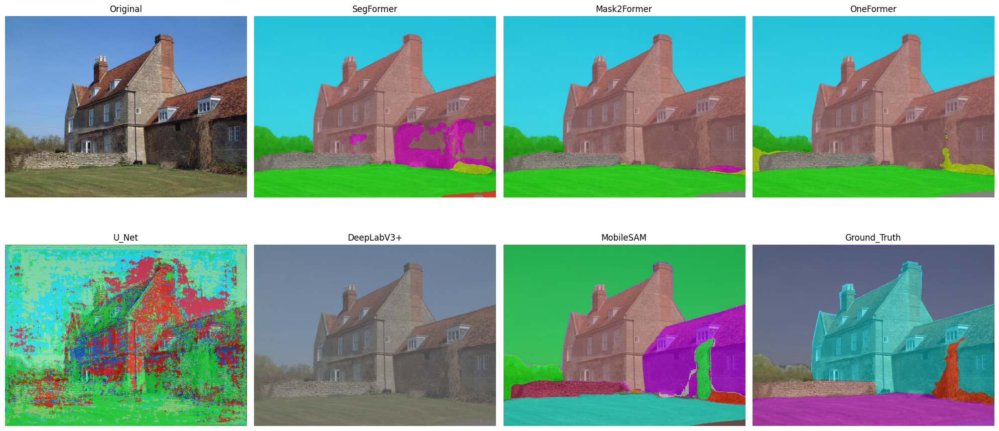

In [167]:
# Example usage 1:
repo_id = "hf-internal-testing/fixtures_ade20k"
image_path = hf_hub_download(repo_id=repo_id, filename="ADE_val_00000001.jpg", repo_type="dataset")
original_img_0 = Image.open(image_path)
original_img_0.save("original_image_0.jpg")
segmentation_map_path = hf_hub_download(repo_id=repo_id, filename="ADE_val_00000001.png", repo_type="dataset")
segmentation_map = Image.open(segmentation_map_path)

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)
print(processor)
print(model)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_0 = segment_image_unified(model, processor, original_img_0, "segformer", alpha=0.6)
result_segf_0.save("segmented_segformer_0.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)
print(processor)
print(model)

result_m2f_0 = segment_image_unified(model, processor, original_img_0, "mask2former", alpha=0.6)
result_m2f_0.save("segmented_mask2former_0.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)
print(processor)
print(model)

result_of_0 = segment_image_unified(model, processor, original_img_0, "oneformer", alpha=0.6)
result_of_0.save("segmented_oneformer_0.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
print(model_unet)
result_unet_0 = segment_image_unified(model_unet, None, original_img_0, "unet_smp", alpha=0.6)
result_unet_0.save("segmented_U_Net_0.jpg")


# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
print(model)
result_dl_0 = segment_image_unified(model, None, original_img_0, "deeplab_tv", alpha=0.6)
result_dl_0.save("segmented_deeplab_0.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
print(model)
result_sam_0 = segment_image_unified(model, None, original_img_0, "sam", alpha=0.6)
result_sam_0.save("segmented_sam_0.jpg")

infer_res = create_overlay(original_img_0, np.array(segmentation_map), alpha=0.5, palette=palette)

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM", "Ground_Truth"]
images = [original_img_0, result_segf_0, result_m2f_0, result_of_0, result_unet_0, result_dl_0, result_sam_0, infer_res]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 4, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

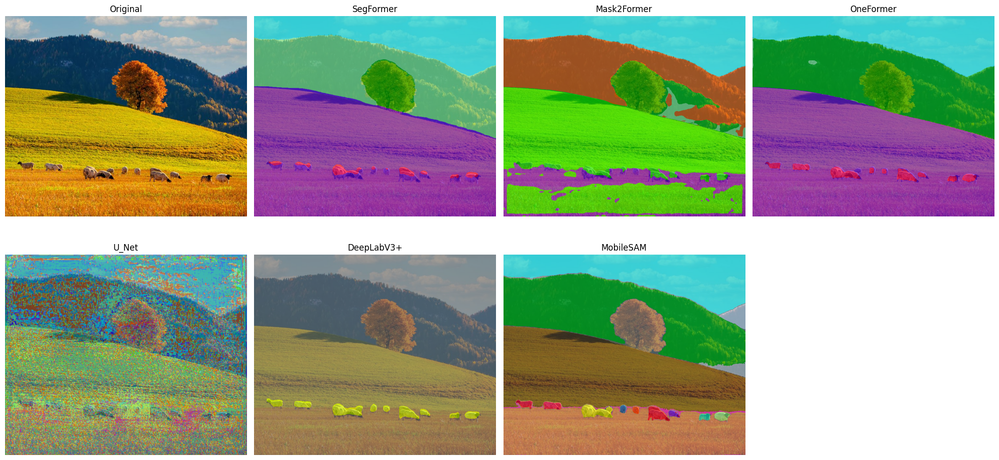

In [ ]:
# Example usage 1:
img_url = "https://i.pinimg.com/736x/17/e7/fc/17e7fc299466b2afd989e709fe7c9815.jpg"

response = requests.get(img_url)
original_img = Image.open(BytesIO(response.content))
original_img.save("original_image.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf = segment_image_unified(model, processor, original_img, "segformer", alpha=0.6)
result_segf.save("segmented_segformer.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f = segment_image_unified(model, processor, original_img, "mask2former", alpha=0.6)
result_m2f.save("segmented_mask2former.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of = segment_image_unified(model, processor, original_img, "oneformer", alpha=0.6)
result_of.save("segmented_oneformer.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet = segment_image_unified(model_unet, None, original_img, "unet_smp", alpha=0.6)
result_unet.save("segmented_U_Net.jpg")


# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl = segment_image_unified(model, None, original_img, "deeplab_tv", alpha=0.6)
result_dl.save("segmented_deeplab.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam = segment_image_unified(model, None, original_img, "sam", alpha=0.6)
result_sam.save("segmented_sam.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM"]
images = [original_img, result_segf, result_m2f, result_of, result_unet, result_dl, result_sam]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 4, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/


0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 1 31, 1 32, 1 33, 1 34, 1 35, 1 36, 1 37, 1 38, 1 39, 1 40, 1 41, 1 42, 1 43, 1 44, 1 45, 1 46, 1 47, 3236.5ms
Speed: 2.6ms preprocess, 3236.5ms inference, 1.8ms postprocess per image at shape (1, 3, 1024, 1024)


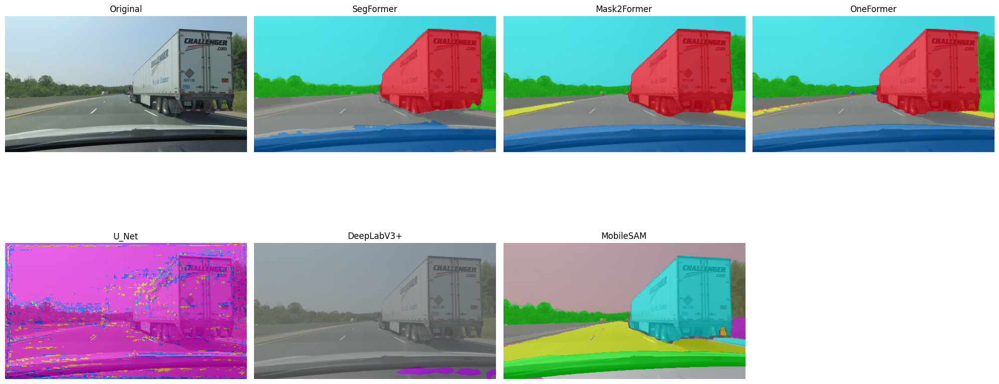

In [ ]:
# Example usage 2:
img_url_2 = "https://www.shutterstock.com/shutterstock/videos/1106252821/thumb/1.jpg?ip=x480"

response_2 = requests.get(img_url_2)
original_img_2 = Image.open(BytesIO(response_2.content))
original_img_2.save("original_image_2.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_2 = segment_image_unified(model, processor, original_img_2, "segformer", alpha=0.6)
result_segf_2.save("segmented_segformer_2.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_2 = segment_image_unified(model, processor, original_img_2, "mask2former", alpha=0.6)
result_m2f_2.save("segmented_mask2former_2.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_2 = segment_image_unified(model, processor, original_img_2, "oneformer", alpha=0.6)
result_of_2.save("segmented_oneformer_2.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_2 = segment_image_unified(model_unet, None, original_img_2, "unet_smp", alpha=0.6)
result_unet_2.save("segmented_U_Net_2.jpg")


# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_2 = segment_image_unified(model, None, original_img_2, "deeplab_tv", alpha=0.6)
result_dl_2.save("segmented_deeplab_2.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_2 = segment_image_unified(model, None, original_img_2, "sam", alpha=0.6)
result_sam_2.save("segmented_sam_2.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM"]
images = [original_img_2, result_segf_2, result_m2f_2, result_of_2, result_unet_2, result_dl_2, result_sam_2]

for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 4, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/


0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 1 31, 1 32, 1 33, 1 34, 3281.4ms
Speed: 3.0ms preprocess, 3281.4ms inference, 2.6ms postprocess per image at shape (1, 3, 1024, 1024)


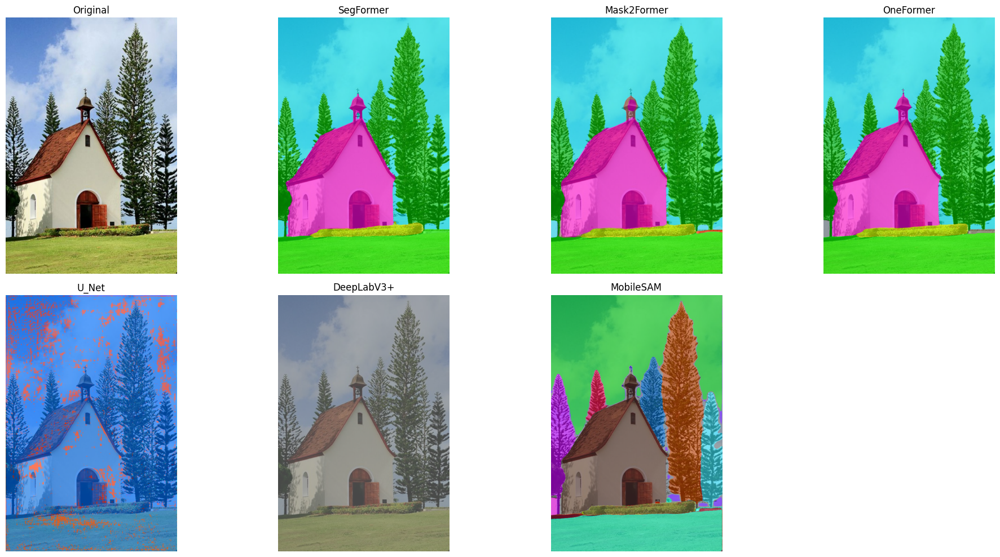

In [ ]:
# Example usage 3:
img_url_3 = "https://i.pinimg.com/736x/86/f6/07/86f60748d5d9ae4cb9092018d1321648.jpg"

response_3 = requests.get(img_url_3)
original_img_3 = Image.open(BytesIO(response_3.content))
original_img_3.save("original_image_3.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_3 = segment_image_unified(model, processor, original_img_3, "segformer", alpha=0.6)
result_segf_3.save("segmented_segformer_3.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_3 = segment_image_unified(model, processor, original_img_3, "mask2former", alpha=0.6)
result_m2f_3.save("segmented_mask2former_3.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_3 = segment_image_unified(model, processor, original_img_3, "oneformer", alpha=0.6)
result_of_3.save("segmented_oneformer_3.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_3 = segment_image_unified(model_unet, None, original_img_3, "unet_smp", alpha=0.6)
result_unet_3.save("segmented_U_Net_3.jpg")


# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_3 = segment_image_unified(model, None, original_img_3, "deeplab_tv", alpha=0.6)
result_dl_3.save("segmented_deeplab_3.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_3 = segment_image_unified(model, None, original_img_3, "sam", alpha=0.6)
result_sam_3.save("segmented_sam_3.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM"]
images = [original_img_3, result_segf_3, result_m2f_3, result_of_3, result_unet_3, result_dl_3, result_sam_3]
for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 4, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/


0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 1 31, 1 32, 1 33, 1 34, 1 35, 1 36, 1 37, 1 38, 1 39, 1 40, 1 41, 1 42, 1 43, 1 44, 1 45, 1 46, 1 47, 1 48, 1 49, 1 50, 1 51, 1 52, 1 53, 1 54, 1 55, 1 56, 1 57, 1 58, 1 59, 1 60, 1 61, 1 62, 1 63, 1 64, 1 65, 3289.8ms
Speed: 2.5ms preprocess, 3289.8ms inference, 2.5ms postprocess per image at shape (1, 3, 1024, 1024)


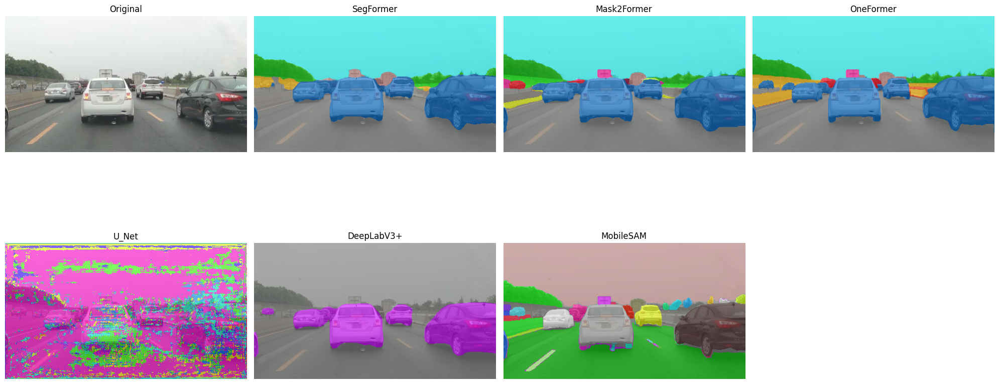

In [ ]:
# Example usage 4:
img_url_4 = "https://images.pond5.com/pov-car-and-truck-traffic-footage-190002081_iconl.jpeg"

response_4 = requests.get(img_url_4)
original_img_4 = Image.open(BytesIO(response_4.content))
original_img_4.save("original_image_4.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_4 = segment_image_unified(model, processor, original_img_4, "segformer", alpha=0.6)
result_segf_4.save("segmented_segformer_4.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_4 = segment_image_unified(model, processor, original_img_4, "mask2former", alpha=0.6)
result_m2f_4.save("segmented_mask2former_4.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_4 = segment_image_unified(model, processor, original_img_4, "oneformer", alpha=0.6)
result_of_4.save("segmented_oneformer_4.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_4 = segment_image_unified(model_unet, None, original_img_4, "unet_smp", alpha=0.6)
result_unet_4.save("segmented_U_Net_4.jpg")

# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_4 = segment_image_unified(model, None, original_img_4, "deeplab_tv", alpha=0.6)
result_dl_4.save("segmented_deeplab_4.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_4 = segment_image_unified(model, None, original_img_4, "sam", alpha=0.6)
result_sam_4.save("segmented_sam_4.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM"]
images = [original_img_4, result_segf_4, result_m2f_4, result_of_4, result_unet_4, result_dl_4, result_sam_4]
for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 4, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/


0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 3183.9ms
Speed: 3.6ms preprocess, 3183.9ms inference, 1.9ms postprocess per image at shape (1, 3, 1024, 1024)


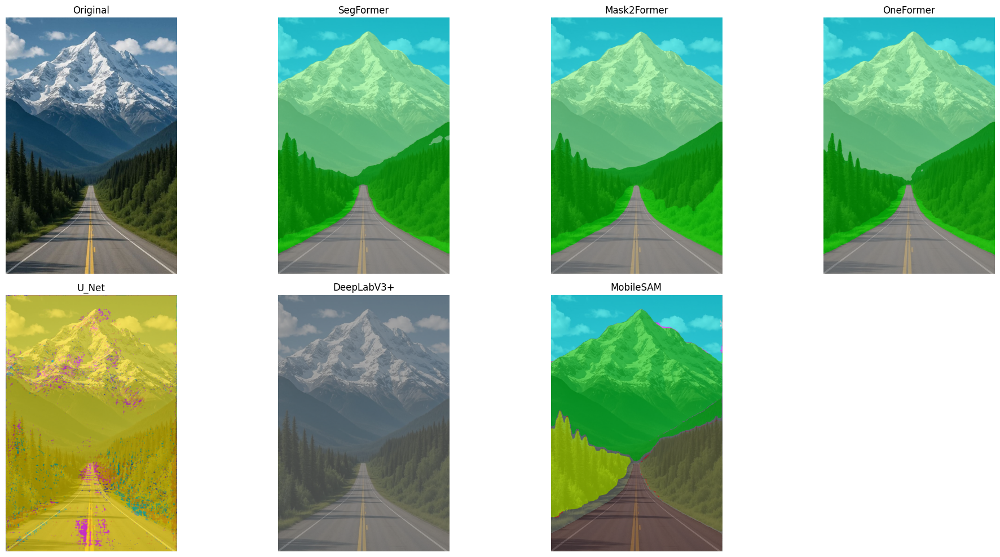

In [ ]:
# Example usage 5:
img_url_5 = "https://i.pinimg.com/736x/17/66/c4/1766c4f667af39f91172ef8eb21ab18a.jpg"

response_5 = requests.get(img_url_5)
original_img_5 = Image.open(BytesIO(response_5.content))
original_img_5.save("original_image_5.jpg")

# === SegFormer ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_5 = segment_image_unified(model, processor, original_img_5, "segformer", alpha=0.6)
result_segf_5.save("segmented_segformer_5.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_5 = segment_image_unified(model, processor, original_img_5, "mask2former", alpha=0.6)
result_m2f_5.save("segmented_mask2former_5.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_5 = segment_image_unified(model, processor, original_img_5, "oneformer", alpha=0.6)
result_of_5.save("segmented_oneformer_5.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_5 = segment_image_unified(model_unet, None, original_img_5, "unet_smp", alpha=0.6)
result_unet_5.save("segmented_U_Net_5.jpg")

# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_5 = segment_image_unified(model, None, original_img_5, "deeplab_tv", alpha=0.6)
result_dl_5.save("segmented_deeplab_5.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_5 = segment_image_unified(model, None, original_img_5, "sam", alpha=0.6)
result_sam_5.save("segmented_sam_5.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM"]
images = [original_img_5, result_segf_5, result_m2f_5, result_of_5, result_unet_5, result_dl_5, result_sam_5]
for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 4, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

✅ Модель успешно загружена с локального пути!
   Путь: /home/yamshchikov/models/segformer-b5-ready
   Устройство: cuda
SegformerConfig {
  "architectures": [
    "SegformerForSemanticSegmentation"
  ],
  "attention_probs_dropout_prob": 0.0,
  "classifier_dropout_prob": 0.1,
  "decoder_hidden_size": 768,
  "depths": [
    3,
    6,
    40,
    3
  ],
  "downsampling_rates": [
    1,
    4,
    8,
    16
  ],
  "drop_path_rate": 0.1,
  "dtype": "float32",
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_sizes": [
    64,
    128,
    320,
    512
  ],
  "id2label": {
    "0": "wall",
    "1": "building",
    "2": "sky",
    "3": "floor",
    "4": "tree",
    "5": "ceiling",
    "6": "road",
    "7": "bed ",
    "8": "windowpane",
    "9": "grass",
    "10": "cabinet",
    "11": "sidewalk",
    "12": "person",
    "13": "earth",
    "14": "door",
    "15": "table",
    "16": "mountain",
    "17": "plant",
    "18": "curtain",
    "19": "chair",
    "20": "car",
    "21": "w

/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/


0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 1 31, 1 32, 3247.3ms
Speed: 4.4ms preprocess, 3247.3ms inference, 2.2ms postprocess per image at shape (1, 3, 1024, 1024)


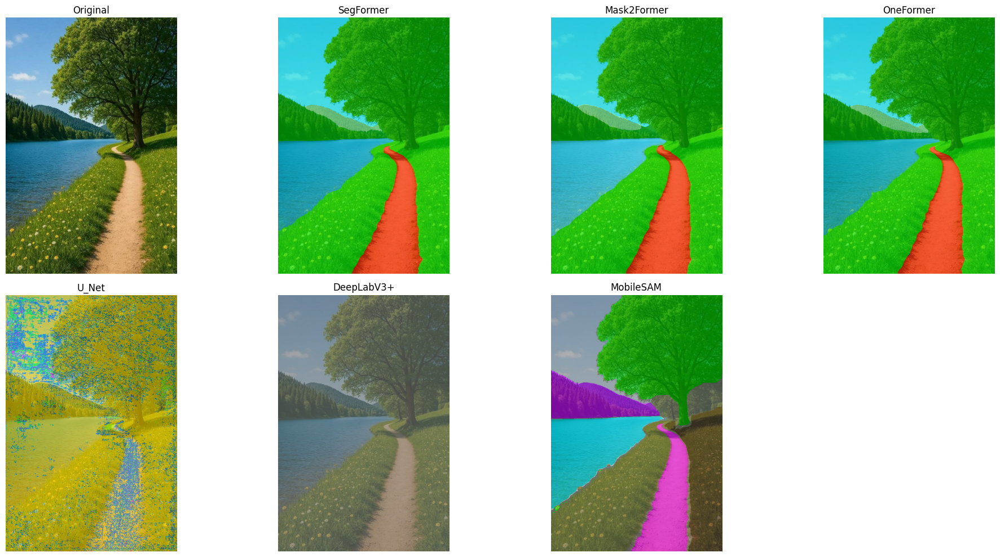

In [ ]:
# Example usage 6:
img_url_6 = "https://i.pinimg.com/736x/f7/5a/f2/f75af26820b50c24600f50f3998eb02f.jpg"

response_6 = requests.get(img_url_6)
original_img_6 = Image.open(BytesIO(response_6.content))
original_img_6.save("original_image_6.jpg")

# === SegFormer ===

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
local_model_path = "/home/yamshchikov/models/segformer-b5-ready"
processor = SegformerImageProcessor(do_resize=False)
model = SegformerForSemanticSegmentation.from_pretrained(local_model_path).to(device)

print(f"✅ Модель успешно загружена с локального пути!")
print(f"   Путь: {local_model_path}")
print(f"   Устройство: {device}")
print(model.config)

result_segf_6 = segment_image_unified(model, processor, original_img_6, "segformer", alpha=0.6)
result_segf_6.save("segmented_segformer_6.jpg")

# === Mask2Former ===
device = "cuda"
model_name = "facebook/mask2former-swin-base-ade-semantic"
processor = Mask2FormerImageProcessor.from_pretrained(model_name)
model = Mask2FormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_m2f_6 = segment_image_unified(model, processor, original_img_6, "mask2former", alpha=0.6)
result_m2f_6.save("segmented_mask2former_6.jpg")

# === OneFormer ===
model_name = "shi-labs/oneformer_ade20k_swin_large"
processor = OneFormerProcessor.from_pretrained(model_name)
model = OneFormerForUniversalSegmentation.from_pretrained(model_name).to(device)

result_of_6 = segment_image_unified(model, processor, original_img_6, "oneformer", alpha=0.6)
result_of_5.save("segmented_oneformer_6.jpg")

# === UNet ===
model_unet = smp.Unet(
    encoder_name="resnet34",
    encoder_weights="imagenet",
    in_channels=3,
    classes=150,  # под ваш датасет (ADE20K = 150)
    activation=None  # None для raw logits
).to(device).eval()
result_unet_6 = segment_image_unified(model_unet, None, original_img_6, "unet_smp", alpha=0.6)
result_unet_6.save("segmented_U_Net_6.jpg")

# === DeepLabV3+ (torchvision) ===
model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True).to(device).eval()
result_dl_6 = segment_image_unified(model, None, original_img_6, "deeplab_tv", alpha=0.6)
result_dl_6.save("segmented_deeplab_6.jpg")

# === MobileSAM ===
model = SAM("mobile_sam.pt")
result_sam_6 = segment_image_unified(model, None, original_img_6, "sam", alpha=0.6)
result_sam_6.save("segmented_sam_6.jpg")

# === Визуализация сравнения ===
plt.figure(figsize=(20, 10))
titles = ["Original", "SegFormer","Mask2Former", "OneFormer", "U_Net", "DeepLabV3+", "MobileSAM"]
images = [original_img_6, result_segf_6, result_m2f_6, result_of_6, result_unet_6, result_dl_6, result_sam_6]
for i, (img, title) in enumerate(zip(images, titles)):
    plt.subplot(2, 4, i+1)
    plt.imshow(img)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [183]:
class SegmentationBenchmark:
    """Полноценный бенчмарк для сравнения архитектур сегментации"""
    
    def __init__(self, device="cuda", num_classes=150, ignore_index=255, class_names: list = None):
        self.device = device
        self.num_classes = num_classes
        self.ignore_index = ignore_index
        self.models = {}
        self.palette = ade_palette()
        self.results = {}  # {model_name: {metrics, time, overlay, ...}}
        self.class_names = class_names or [f"Class {i}" for i in range(num_classes)]

    def load_model(self, key: str, model, processor=None, model_type: str = "hf"):
        """Регистрация модели для бенчмарка"""
        self.models[key] = {"model": model, "processor": processor, "type": model_type}
        return self
    
    def load_segformer(self, path: str):
        from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation
        processor = SegformerImageProcessor.from_pretrained(path)
        model = SegformerForSemanticSegmentation.from_pretrained(path).to(self.device).eval()
        return self.load_model("segformer", model, processor, "segformer")
    
    def load_mask2former(self, name: str = "facebook/mask2former-swin-base-ade-semantic"):
        from transformers import Mask2FormerImageProcessor, Mask2FormerForUniversalSegmentation
        processor = Mask2FormerImageProcessor.from_pretrained(name)
        model = Mask2FormerForUniversalSegmentation.from_pretrained(name).to(self.device).eval()
        return self.load_model("mask2former", model, processor, "mask2former")
    
    def load_oneformer(self, name: str = "shi-labs/oneformer_ade20k_swin_large"):
        from transformers import OneFormerProcessor, OneFormerForUniversalSegmentation
        processor = OneFormerProcessor.from_pretrained(name)
        model = OneFormerForUniversalSegmentation.from_pretrained(name).to(self.device).eval()
        return self.load_model("oneformer", model, processor, "oneformer")
    
    def load_deeplab(self):
        import torchvision
        model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True)
        return self.load_model("deeplab_tv", model.to(self.device).eval(), None, "deeplab_tv")
    
    def load_unet(self, encoder_name="resnet34"):
        import segmentation_models_pytorch as smp
        model = smp.Unet(encoder_name=encoder_name, encoder_weights="imagenet", 
                        in_channels=3, classes=self.num_classes, activation=None)
        return self.load_model("unet_smp", model.to(self.device).eval(), None, "unet_smp")
    
    def load_sam(self, path="mobile_sam.pt"):
        from ultralytics import SAM
        return self.load_model("sam", SAM(path), None, "sam")

    def run_single(self, image_input, model_key: str, gt_mask: np.ndarray = None, 
                   alpha: float = 0.6, log_logits: bool = True):
        """Запуск одной модели с сбором метрик"""
        import time
        from PIL import Image
        
        # Загрузка изображения
        if isinstance(image_input, str):
            image = Image.open(image_input).convert("RGB")
        elif isinstance(image_input, Image.Image):
            image = image_input.convert("RGB")
        else:
            raise ValueError("Unsupported input type")
        
        model_cfg = self.models[model_key]
        model = model_cfg["model"]
        processor = model_cfg["processor"]
        model_type = model_cfg["type"]
        
        # Замер времени + warm-up
        for _ in range(2):
            _ = segment_image_unified(model, processor, image, model_type, 
                                     alpha=0.0, palette=self.palette, device=self.device)
        
        torch.cuda.synchronize()
        t0 = time.time()
        
        # Инференс
        overlay = segment_image_unified(model, processor, image, model_type, 
                                       alpha=alpha, palette=self.palette, device=self.device)
        
        torch.cuda.synchronize()
        inference_time = time.time() - t0
        # Получение маски для метрик (повторный инференс без визуализации для чистоты)
        if model_type == "segformer":
            mask, _ = infer_segformer(model, processor, image, self.device)
        elif model_type == "mask2former":
            mask, _ = infer_mask2former(model, processor, image, self.device)
        elif model_type == "oneformer":
            mask, _ = infer_oneformer(model, processor, image, self.device)
        elif model_type == "deeplab_tv":
            mask, _ = infer_deeplab_torchvision(model, image, self.device)
        elif model_type == "unet_smp":
            mask, _ = infer_unet_smp(model, image, device=self.device)
        elif model_type == "sam":
            mask, _ = infer_sam(model, image, self.device)
        else:
            raise ValueError(f"Unknown model_type: {model_type}")
        
        # 📊 Метрики (если есть ground truth)
        metrics = {}
        if gt_mask is not None:
            gt_np = np.array(gt_mask) if isinstance(gt_mask, Image.Image) else gt_mask
            metrics = compute_metrics(mask, gt_np, self.num_classes, self.ignore_index)
        
        result = {
            "model": model_type,
            "overlay": overlay,
            "mask": mask,
            "inference_time_ms": inference_time * 1000,
            "metrics": metrics,
            "image_size": image.size[::-1],
            "output_shape": mask.shape,
            "unique_classes": len(np.unique(mask))
        }
        
        self.results[model_key] = result
        return result
    
    def predict(self, image_input, model_key: str, alpha=0.5):
        if model_key not in self.models:
            raise ValueError(f"Model {model_key} not loaded. Available: {list(self.models.keys())}")
        model, processor = self.models[model_key]
        return segment_image_unified(model, processor, image_input, model_key, 
                                    alpha=alpha, palette=self.palette, device=self.device)
    
    def compare(self, image_input, gt_mask: np.ndarray = None, alpha: float = 0.6):
        """Запускает все загруженные модели и возвращает dict со сводными результатами"""
        print(f"🚀 Starting benchmark on {len(self.models)} models...")
        
        for key in self.models:
            print(f"\n🔹 Running {key}...")
            self.run_single(image_input, key, gt_mask, alpha=alpha)
        
        return self.get_summary()
        # results = {}
        # for key in self.models:
        #     print(f"Running {key}...")
        #     results[key] = self.predict(image_input, key, alpha=alpha)
        # return results

    def get_summary(self):
        """Возвращает сводную таблицу метрик"""
        summary = {}
        for key, res in self.results.items():
            summary[key] = {
                "mIoU": res["metrics"].get("mIoU", np.nan),
                "pixel_acc": res["metrics"].get("pixel_acc", np.nan),
                "f1_weighted": res["metrics"].get("f1_weighted", np.nan),
                "time_ms": res["inference_time_ms"],
                "unique_classes": res["unique_classes"]
            }
        return summary

    def plot_comparison_chart(self, metric_name: str, title: str, figsize=(10, 6)):
        """
        Строит бар-чарт сравнения одной метрики по всем моделям.
        
        Args:
            metric_name: ключ метрики ("mIoU", "pixel_acc", "f1_weighted", "time_ms")
            title: заголовок графика (по умолчанию: "Model Comparison: {metric_name}")
            figsize: размер фигуры
        """
        summary = self.get_summary()
        if not summary:
            print("⚠️ No results to plot. Run compare() first.")
            return
        
        models = list(summary.keys())
        values = [summary[m].get(metric_name, np.nan) for m in models]
        
        # Фильтруем модели без данных
        valid = [(m, v) for m, v in zip(models, values) if not np.isnan(v)]
        if not valid:
            print(f"⚠️ No valid data for metric '{metric_name}'")
            return
        
        models, values = zip(*valid)
        
        plt.figure(figsize=figsize)
        colors = plt.cm.Set2(np.linspace(0, 1, len(models)))
        bars = plt.bar(models, values, color=colors, edgecolor='black')
        
        # Подписи значений
        for bar, val in zip(bars, values):
            label = f"{val*100:.1f}%" if metric_name in ["mIoU", "pixel_acc", "f1_weighted"] else f"{val:.1f}"
            plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + (0.01 if val < 1 else 1), 
                    label, ha='center', va='bottom', fontsize=9, rotation=0)
        
        plt.ylabel(metric_name)
        plt.title(title or f"Model Comparison: {metric_name}")
        plt.xticks(rotation=45, ha='right')
        plt.grid(axis='y', alpha=0.3, linestyle='--')
        plt.tight_layout()
        plt.show()

    # def plot_per_class_iou(self, top_k: int = 20, figsize=(14, 8), cmap: str = "RdYlGn"):
    #     """
    #     Строит heatmap пер-класс IoU для всех моделей.
        
    #     Args:
    #         top_k: показать только top-k классов по среднему IoU
    #         figsize: размер фигуры
    #         cmap: цветовая схема matplotlib
    #     """
    #     data = []
    #     model_names = []
        
    #     for model_name, res in self.results.items():
    #         iou_arr = res["metrics"].get("per_class_iou")
    #         if iou_arr is not None and len(iou_arr) > 0:
    #             # Берём top-k классов по среднему IoU или первые 20
    #             iou_arr = np.array(iou_arr[:self.num_classes])
    #             data.append(iou_arr)
    #             model_names.append(model_name)
        
    #     if not data:
    #         print("⚠️ No per-class IoU data available. Run with gt_mask first.")
    #         return
        
    #     # Выбираем top-k классов по среднему IoU
    #     data = np.array(data)  # shape: [n_models, n_classes]
    #     mean_iou = np.nanmean(data, axis=0)
    #     top_indices = np.argsort(mean_iou)[::-1][:top_k]
        
    #     # Подписи классов
    #     class_labels = [self.class_names[i] if i < len(self.class_names) else f"C{i}" for i in top_indices]
        
    #     plt.figure(figsize=figsize)
    #     sns.heatmap(data[:, top_indices], 
    #                 xticklabels=class_labels, 
    #                 yticklabels=model_names,
    #                 cmap=cmap, 
    #                 center=0.5, 
    #                 annot=False,
    #                 cbar_kws={'label': 'IoU'})
        
    #     plt.title(f"Per-class IoU Comparison (top {top_k} classes by mean IoU)")
    #     plt.xlabel("Class")
    #     plt.ylabel("Model")
    #     plt.xticks(rotation=45, ha='right', fontsize=8)
    #     plt.yticks(fontsize=9)
    #     plt.tight_layout()
    #     plt.show()
    def plot_per_class_iou(self, top_k: int = 20, figsize=(14, 8), cmap: str = "RdYlGn"):
        """
        Строит heatmap пер-класс IoU с проверкой валидности данных.
        """
        import numpy as np
        import matplotlib.pyplot as plt
        import seaborn as sns
        
        data = []
        model_names = []
        
        for model_name, res in self.results.items():
            iou_arr = res["metrics"].get("per_class_iou")
            
            # 🔧 Проверка: данные существуют и не все NaN
            if iou_arr is not None and len(iou_arr) > 0:
                iou_arr = np.array(iou_arr[:self.num_classes])
                
                # Проверяем, есть ли хоть какие-то валидные значения
                if np.any(np.isfinite(iou_arr)):
                    # Padding если классов меньше ожидаемого
                    if len(iou_arr) < self.num_classes:
                        padding = np.full(self.num_classes - len(iou_arr), np.nan)
                        iou_arr = np.concatenate([iou_arr, padding])
                    data.append(iou_arr[:self.num_classes])
                    model_names.append(model_name)
                else:
                    print(f"⚠️ {model_name}: per_class_iou содержит только NaN")
        
        if not data:
            print("❌ No valid per-class IoU data available.")
            print("💡 Убедитесь, что:")
            print("   1. Вы передали gt_mask в bench.compare()")
            print("   2. Ground truth имеет правильную индексацию (0..num_classes-1)")
            print("   3. ignore_index установлен корректно (255 для фона)")
            return
        
        # Конвертируем в 2D array
        data = np.array(data)
        
        # Проверяем, есть ли хоть какие-то валидные данные для heatmap
        if np.all(np.isnan(data)):
            print("❌ All data is NaN. Check ground truth alignment.")
            return
        
        # Выбираем top-k классов по среднему IoU
        mean_iou = np.nanmean(data, axis=0)
        valid_classes = np.isfinite(mean_iou)
        
        if np.sum(valid_classes) == 0:
            print("❌ No valid classes found. Check ground truth values.")
            return
        
        # Берём top-k среди валидных классов
        top_indices = np.argsort(mean_iou[valid_classes])[::-1][:top_k]
        # Возвращаем оригинальные индексы
        top_indices = np.where(valid_classes)[0][top_indices]
        
        # Подписи классов
        class_labels = [self.class_names[i] if i < len(self.class_names) else f"C{i}" for i in top_indices]
        
        # 🔧 Фильтруем данные только по выбранным классам
        data_filtered = data[:, top_indices]
        
        plt.figure(figsize=figsize)
        ax = sns.heatmap(data_filtered, 
                    xticklabels=class_labels, 
                    yticklabels=model_names,
                    cmap=cmap, 
                    center=0.5, 
                    annot=False,
                    cbar_kws={'label': 'IoU'},
                    vmin=0, vmax=1)  # явные границы для цветов
        
        plt.title(f"Per-class IoU Comparison (top {len(top_indices)} classes by mean IoU)")
        plt.xlabel("Class")
        plt.ylabel("Model")
        plt.xticks(rotation=45, ha='right', fontsize=8)
        plt.yticks(fontsize=9)
        plt.tight_layout()
        plt.show()

    def plot_confusion_matrix(self, model_key: str, normalize: str = 'true', figsize=(10, 8)):
        """
        Строит матрицу ошибок для указанной модели.
        
        Args:
            model_key: ключ модели в self.results
            normalize: 'true' (по строкам), 'pred' (по столбцам), 'all', или None
            figsize: размер фигуры
        """
        if model_key not in self.results:
            print(f"⚠️ Model '{model_key}' not found in results.")
            return
        
        cm = self.results[model_key]["metrics"].get("confusion_matrix")
        if cm is None:
            print("⚠️ No confusion matrix available. Run with gt_mask first.")
            return
        
        # Нормализация по строкам (recall)
        if normalize == 'true':
            cm_display = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            title_suffix = "(recall)"
        elif normalize == 'pred':
            cm_display = cm.astype('float') / cm.sum(axis=0)[np.newaxis, :]
            title_suffix = "(precision)"
        elif normalize == 'all':
            cm_display = cm.astype('float') / cm.sum()
            title_suffix = "(overall)"
        else:
            cm_display = cm
            title_suffix = "(counts)"
        
        # Отображаем только первые 20 классов для читаемости
        n_display = min(20, cm_display.shape[0])
        class_labels = [self.class_names[i] if i < len(self.class_names) else f"C{i}" for i in range(n_display)]
        
        plt.figure(figsize=figsize)
        sns.heatmap(cm_display[:n_display, :n_display], 
                    xticklabels=class_labels, 
                    yticklabels=class_labels,
                    cmap="Blues", 
                    annot=False, 
                    fmt='.2f' if normalize else '.0f',
                    cbar_kws={'label': 'Normalized count' if normalize else 'Count'})
        
        plt.title(f"Confusion Matrix: {model_key} {title_suffix}")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.xticks(rotation=45, ha='right', fontsize=8)
        plt.yticks(fontsize=8)
        plt.tight_layout()
        plt.show()

    def plot_all_metrics(self, figsize=(12, 5)):
        """Строит сводные графики по всем основным метрикам"""
        summary = self.get_summary()
        if not summary:
            print("⚠️ No results to plot.")
            return
        
        metrics_to_plot = [
            ("mIoU", "Mean IoU ↑", lambda x: x*100),
            ("pixel_acc", "Pixel Accuracy ↑", lambda x: x*100),
            ("time_ms", "Inference Time ↓ (ms)", lambda x: x)
        ]
        
        fig, axes = plt.subplots(1, 3, figsize=figsize)
        colors = plt.cm.Set2(np.linspace(0, 1, len(summary)))
        
        for ax, (metric, label, transform) in zip(axes, metrics_to_plot):
            models = list(summary.keys())
            values = [transform(summary[m].get(metric, np.nan)) for m in models]
            valid = [(m, v) for m, v in zip(models, values) if not np.isnan(v)]
            if valid:
                models, values = zip(*valid)
                bars = ax.bar(models, values, color=colors[:len(models)], edgecolor='black')
                for bar, val in zip(bars, values):
                    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(), 
                           f"{val:.1f}", ha='center', va='bottom', fontsize=8)
            ax.set_ylabel(label)
            ax.set_title(metric)
            ax.tick_params(axis='x', rotation=45)
            ax.grid(axis='y', alpha=0.3)
        
        plt.suptitle("Model Comparison Summary", fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.show()

    def plot_summary(self, metrics: list = ["mIoU", "pixel_acc", "time_ms"]):
        """Визуализация сводных результатов"""
        summary = self.get_summary()
        
        for metric in metrics:
            values = [summary[k].get(metric, np.nan) for k in summary]
            if all(np.isnan(v) for v in values):
                continue
                
            plt.figure(figsize=(10, 5))
            plt.bar(summary.keys(), values, color=plt.cm.Set2(np.linspace(0, 1, len(summary))))
            plt.ylabel(metric)
            plt.title(f"Model Comparison: {metric}")
            plt.xticks(rotation=45, ha='right')
            plt.grid(axis='y', alpha=0.3)
            plt.tight_layout()
            plt.show()

    def save_results(self, output_dir: str = "benchmark_results"):
        """Сохранение всех результатов с корректной сериализацией numpy-типов"""
        import os
        import json
        import pandas as pd
        import numpy as np
        
        os.makedirs(output_dir, exist_ok=True)
        
        # Сохранение изображений и масок
        for key, res in self.results.items():
            if res["overlay"] is not None:
                res["overlay"].save(f"{output_dir}/overlay_{key}.jpg")
            if res["mask"] is not None:
                np.save(f"{output_dir}/mask_{key}.npy", res["mask"])
        
        # Сводная таблица
        df = pd.DataFrame(self.get_summary()).T
        df.to_csv(f"{output_dir}/summary.csv")
        
        # 🔧 ИСПРАВЛЕНИЕ: кастомная функция для конвертации numpy-типов
        def convert_numpy_types(obj):
            """Рекурсивно конвертирует numpy-типы в Python-native для JSON"""
            if isinstance(obj, np.ndarray):
                return obj.tolist()
            elif isinstance(obj, (np.int64, np.int32, np.int16, np.int8)):
                return int(obj)
            elif isinstance(obj, (np.float64, np.float32, np.float16)):
                return float(obj)
            elif isinstance(obj, dict):
                return {k: convert_numpy_types(v) for k, v in obj.items()}
            elif isinstance(obj, list):
                return [convert_numpy_types(item) for item in obj]
            elif isinstance(obj, tuple):
                return tuple(convert_numpy_types(item) for item in obj)
            else:
                return obj
        
        # Детальные метрики
        detailed = {}
        for key, res in self.results.items():
            detailed[key] = {
                "inference_time_ms": float(res["inference_time_ms"]),
                "metrics": convert_numpy_types(res["metrics"]),
                "image_size": [int(x) for x in res["image_size"]],
                "output_shape": [int(x) for x in res["output_shape"]],
                "unique_classes": int(res["unique_classes"])
            }
        
        with open(f"{output_dir}/detailed.json", "w") as f:
            json.dump(detailed, f, indent=2, default=str)  # default=str как запасной вариант
        
        print(f"✅ Results saved to {output_dir}/")

    def export_latex_table(self, caption: str = "Segmentation Benchmark Results"):
        """Генерирует LaTeX-код таблицы для публикации"""
        summary = self.get_summary()
        if not summary:
            return ""
        
        lines = [
            r"\begin{table}[htbp]",
            r"\centering",
            r"\caption{" + caption + r"}",
            r"\label{tab:benchmark}",
            r"\begin{tabular}{lccc}",
            r"\toprule",
            r"\textbf{Model} & \textbf{mIoU (\%)} & \textbf{Acc (\%)} & \textbf{Time (ms)} \\",
            r"\midrule"
        ]
        
        for model, metrics in summary.items():
            mIoU = f"{metrics['mIoU']*100:.1f}" if not np.isnan(metrics['mIoU']) else "-"
            acc = f"{metrics['pixel_acc']*100:.1f}" if not np.isnan(metrics['pixel_acc']) else "-"
            time = f"{metrics['time_ms']:.1f}"
            model_clean = model.replace("_", r"\_").replace("-", r"\-")
            lines.append(f"{model_clean} & {mIoU} & {acc} & {time} \\\\")
        
        lines.extend([r"\bottomrule", r"\end{tabular}", r"\end{table}"])
        return "\n".join(lines)

In [ ]:
# # Инициализация
# bench = SegmentationBenchmark(device="cuda")
# bench.load_mask2former().load_oneformer().load_deeplab().load_sam()

# # Сравнение на одном изображении
# results = bench.compare("original_image_2.jpg", alpha=0.6)

# # Сохранение
# for name, img in results.items():
#     img.save(f"result_{name}.jpg")

Running mask2former...
Running oneformer...
Running deeplab_tv...
Running sam...

0: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 1 31, 1 32, 1 33, 1 34, 1 35, 1 36, 1 37, 1 38, 1 39, 3195.8ms
Speed: 2.4ms preprocess, 3195.8ms inference, 1.5ms postprocess per image at shape (1, 3, 1024, 1024)


/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `Mask2FormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yamshchikov/ML_practice/Torchvision_core_project/MLvenv/lib/python3.12/site-packages/transformers/image_processing_base.py:417: UserWarning: The following named arguments are not valid for `OneFormerImageProcessor.__init__` and were ignored: '_max_size', 'reduce_labels'
  image_processor = cls(**image_processor_dict)
/home/yams

🚀 Starting benchmark on 6 models...

🔹 Running segformer...
<class 'torch.Tensor'>
📈 SegFormer logits: {'type': 'Tensor', 'shape': (1, 150, 160, 160), 'min': -54.35194396972656, 'max': 1.0249148607254028, 'mean': -23.62163734436035, 'std': 5.86198091506958, 'device': 'cuda:0'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'type': 'Tensor', 'shape': (1, 150, 160, 160), 'min': -54.35194396972656, 'max': 1.0249148607254028, 'mean': -23.62163734436035, 'std': 5.86198091506958, 'device': 'cuda:0'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]
 [9 9 9 ... 6 6 6]]
<class 'torch.Tensor'>
📈 SegFormer logits: {'type': 'Tensor', 'shape': (1, 150, 160, 160), 'min': -54.35194396972656, 'max': 1.0249148607254028, 'mean': -23.62163734436035, 'std': 5.86198091506958, 'device': 'cuda:0'}
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 

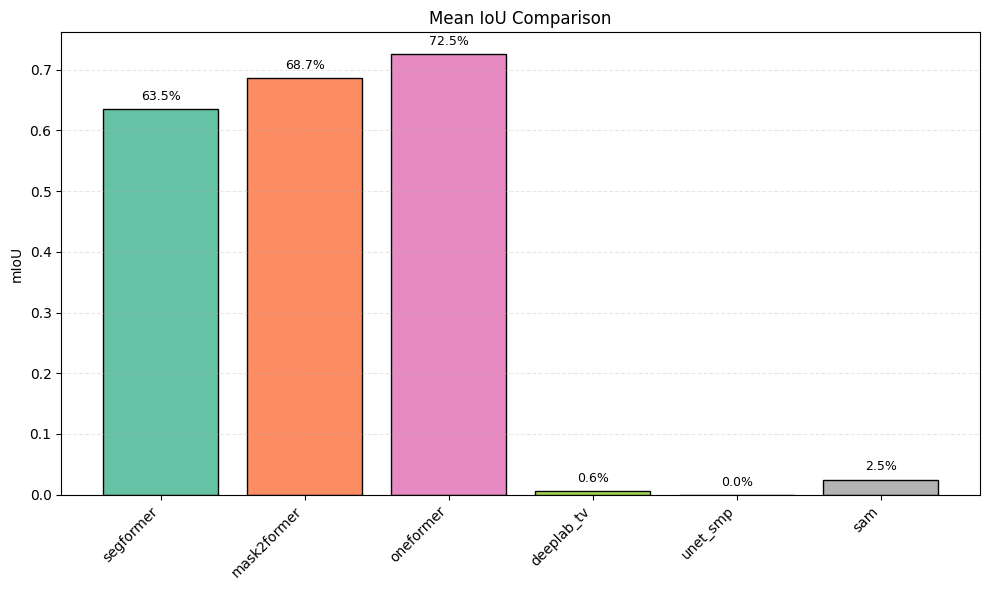

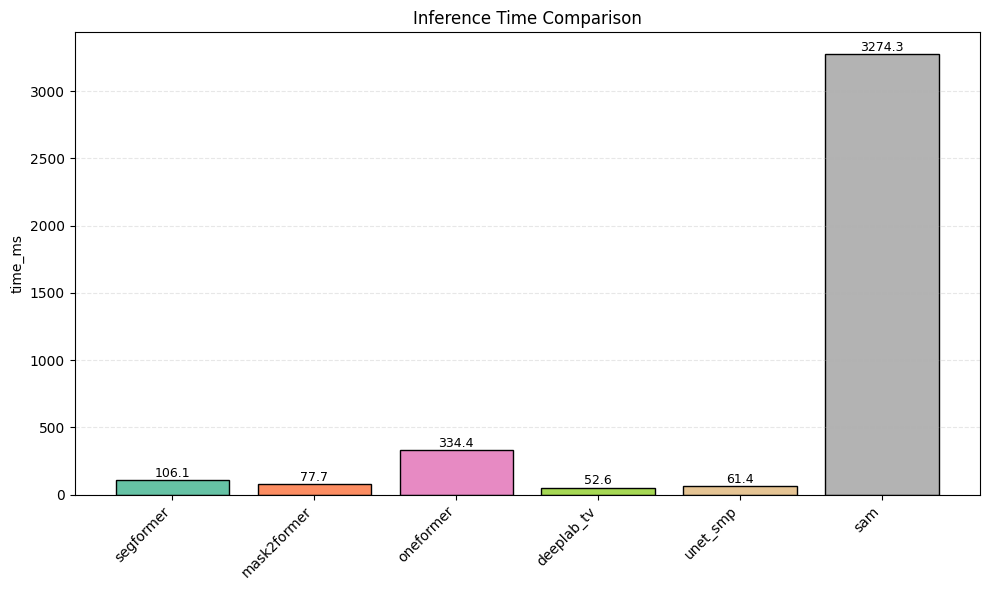

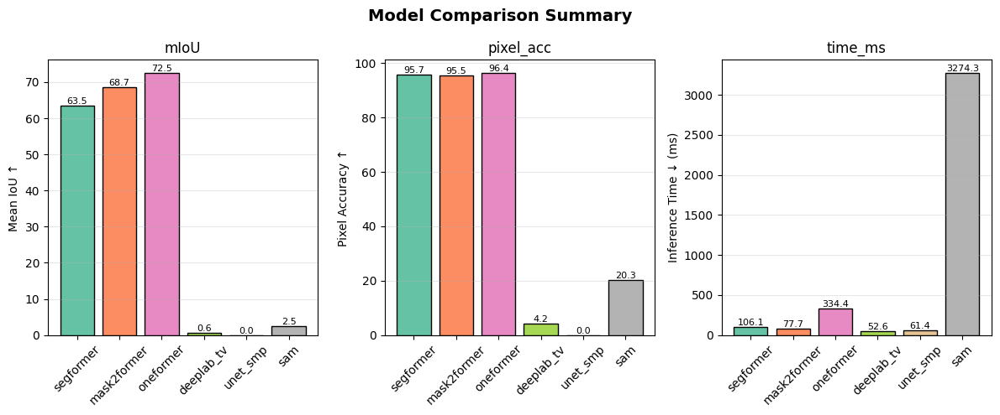

/tmp/ipykernel_553675/2375950970.py:291: RuntimeWarning: Mean of empty slice
  mean_iou = np.nanmean(data, axis=0)


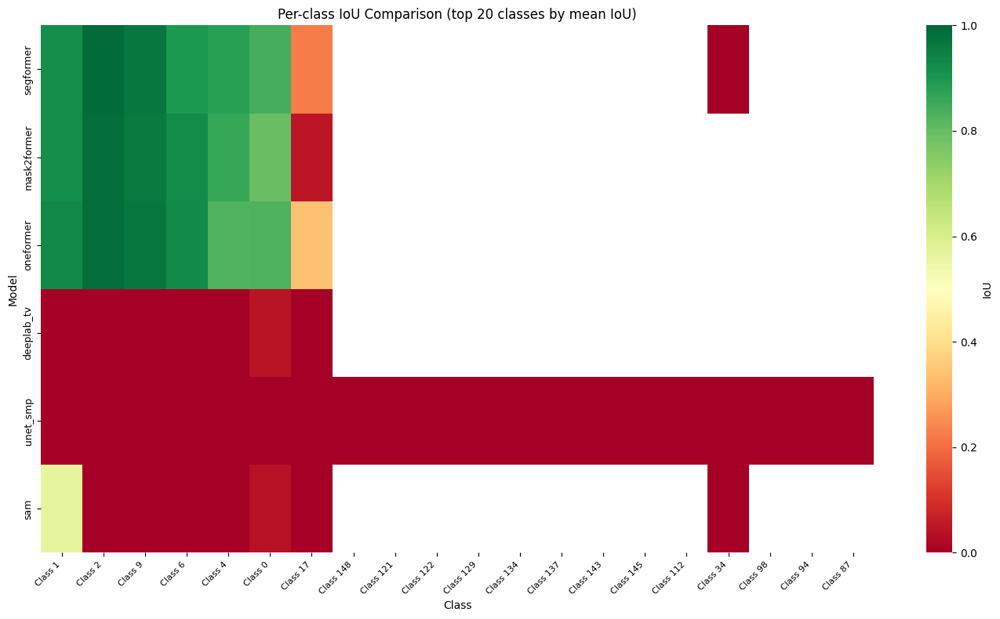

/tmp/ipykernel_553675/2375950970.py:347: RuntimeWarning: invalid value encountered in divide
  cm_display = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


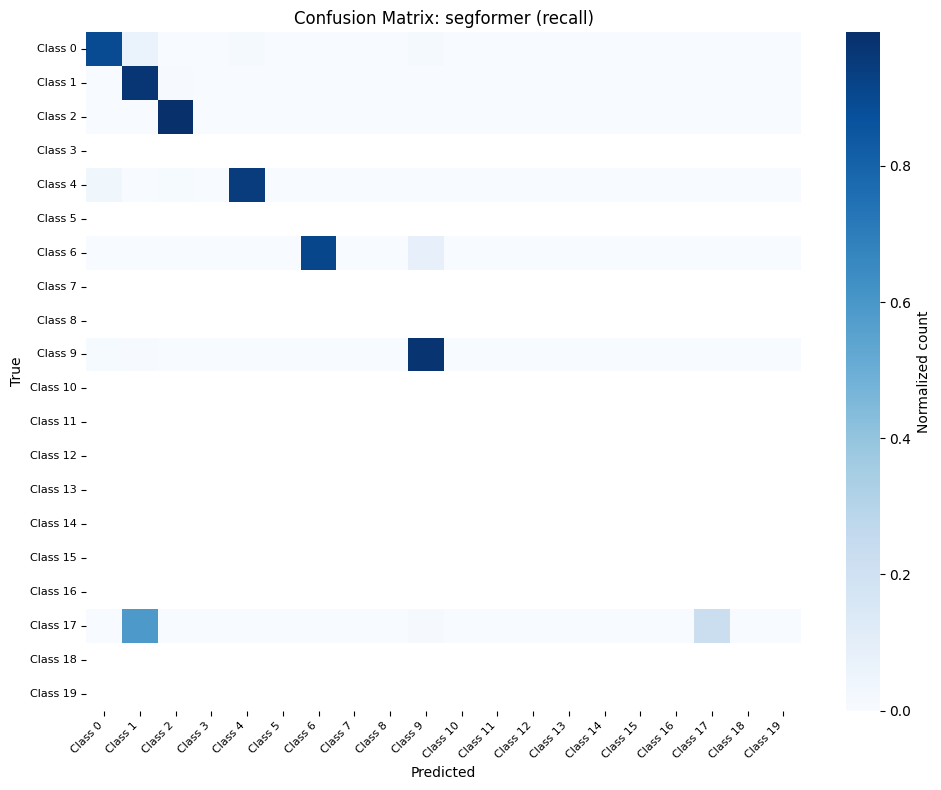

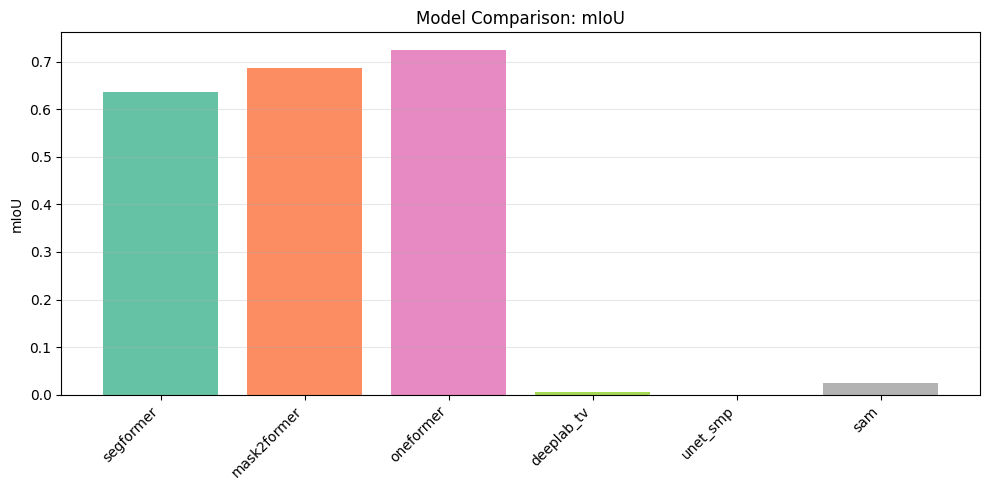

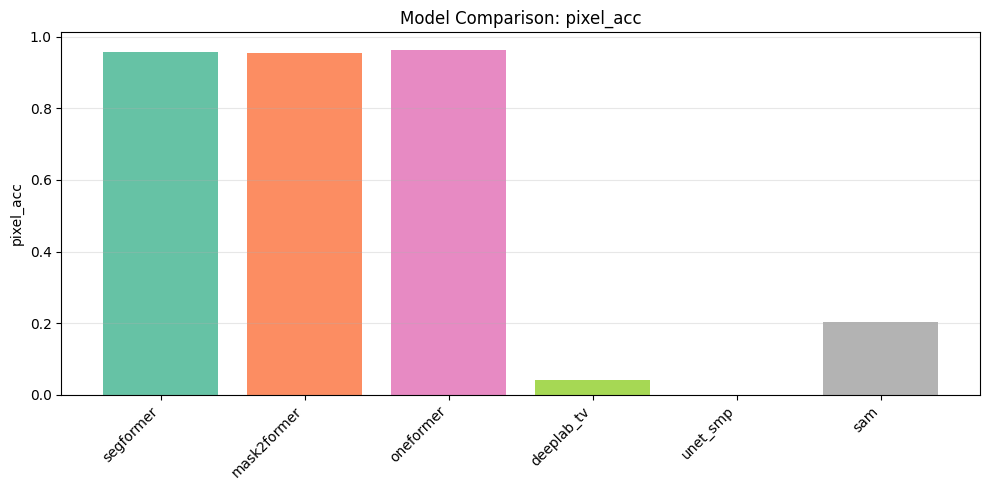

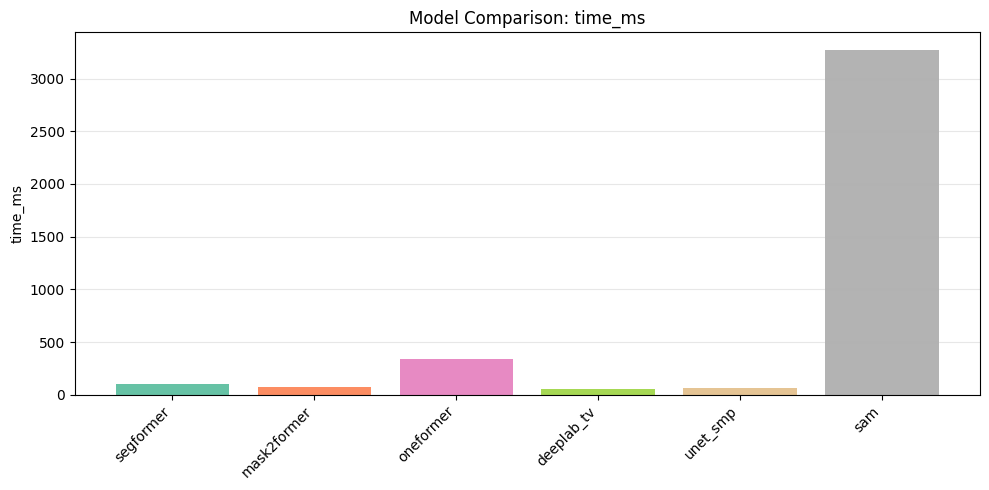

✅ Results saved to ade20k_benchmark_v1/

segformer:
  mIoU: 0.6354
  Time: 106.1 ms
  Classes: 9

mask2former:
  mIoU: 0.6865
  Time: 77.7 ms
  Classes: 8

oneformer:
  mIoU: 0.7254
  Time: 334.4 ms
  Classes: 8

deeplab_tv:
  mIoU: 0.0060
  Time: 52.6 ms
  Classes: 1

unet_smp:
  mIoU: 0.0000
  Time: 61.4 ms
  Classes: 27

sam:
  mIoU: 0.0249
  Time: 3274.3 ms
  Classes: 22
\begin{table}[htbp]
\centering
\caption{ADE20K Segmentation Benchmark}
\label{tab:benchmark}
\begin{tabular}{lccc}
\toprule
\textbf{Model} & \textbf{mIoU (\%)} & \textbf{Acc (\%)} & \textbf{Time (ms)} \\
\midrule
segformer & 63.5 & 95.7 & 106.1 \\
mask2former & 68.7 & 95.5 & 77.7 \\
oneformer & 72.5 & 96.4 & 334.4 \\
deeplab\_tv & 0.6 & 4.2 & 52.6 \\
unet\_smp & 0.0 & 0.0 & 61.4 \\
sam & 2.5 & 20.3 & 3274.3 \\
\bottomrule
\end{tabular}
\end{table}


In [184]:
# === Инициализация бенчмарка ===
bench = SegmentationBenchmark(device="cuda", num_classes=150)

# Загрузка моделей
bench.load_segformer("/home/yamshchikov/models/segformer-b5-ready") \
     .load_mask2former() \
     .load_oneformer() \
     .load_deeplab() \
     .load_unet() \
     .load_sam("mobile_sam.pt")

# Загрузка тестового изображения + ground truth
from huggingface_hub import hf_hub_download
from PIL import Image

repo_id = "hf-internal-testing/fixtures_ade20k"
img_path = hf_hub_download(repo_id, "ADE_val_00000001.jpg", repo_type="dataset")
gt_path = hf_hub_download(repo_id, "ADE_val_00000001.png", repo_type="dataset")

test_image = Image.open(img_path).convert("RGB")
ground_truth = np.array(Image.open(gt_path)) - 1  # ADE20K: 1→0 индексация

# === Запуск сравнения ===
bench.compare(test_image, gt_mask=ground_truth, alpha=0.6)  # -1 для 0-индексации

# === Визуализация результатов ===
# 1. Бар-чарты по метрикам
bench.plot_comparison_chart("mIoU", title="Mean IoU Comparison")
bench.plot_comparison_chart("time_ms", title="Inference Time Comparison")

# 2. Сводный график всех метрик
bench.plot_all_metrics()

# 3. Heatmap пер-класс IoU (топ-20 классов)
bench.plot_per_class_iou(top_k=20)

# 4. Матрица ошибок для конкретной модели
bench.plot_confusion_matrix("segformer", normalize='true')
bench.plot_summary(metrics=["mIoU", "pixel_acc", "time_ms"])

# === Сохранение ===
bench.save_results("ade20k_benchmark_v1")

# === Ручной доступ к результатам ===
for model_name, res in bench.results.items():
    print(f"\n{model_name}:")
    print(f"  mIoU: {res['metrics'].get('mIoU', 'N/A'):.4f}")
    print(f"  Time: {res['inference_time_ms']:.1f} ms")
    print(f"  Classes: {res['unique_classes']}")

# === Экспорт в LaTeX для статьи ===
print(bench.export_latex_table(caption="ADE20K Segmentation Benchmark"))